In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from gtda.pipeline import Pipeline
from gtda.time_series import Resampler
from gtda.diagrams import PersistenceEntropy, Scaler, HeatKernel, BettiCurve
import numpy as np
from gtda.time_series import SingleTakensEmbedding, takens_embedding_optimal_parameters, TakensEmbedding
from sklearn.decomposition import PCA
from gtda.plotting import plot_point_cloud
from gtda.homology import VietorisRipsPersistence
from gtda.metaestimators import CollectionTransformer

We start by analyzing the public data set and looking at the normal operations time series, to set a benchmark for the analysis of well events (abnormal operations). 

In [58]:
sample_data_df = pd.read_csv("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/0/WELL-00008_20170630130246.csv")

In [38]:
sample_data_df = pd.read_csv("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/0/WELL-00008_20170914020321.csv")

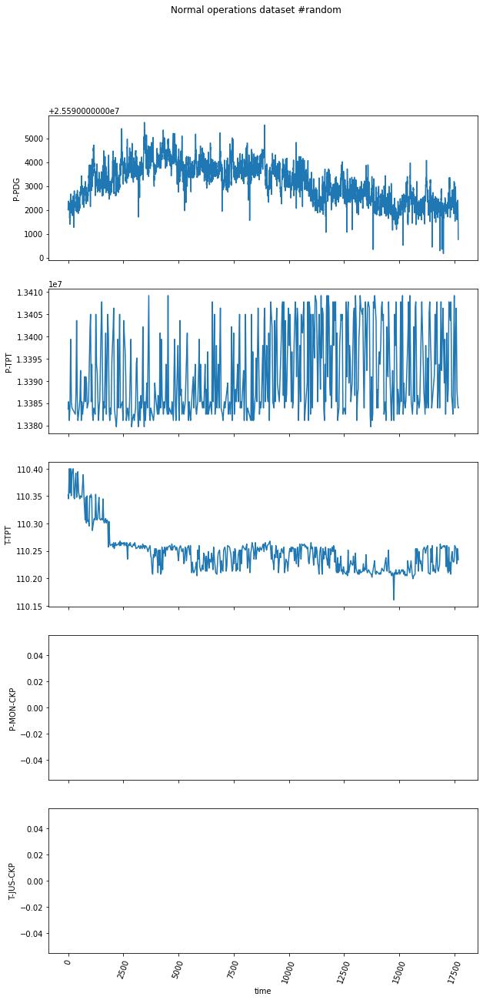

In [59]:
fig, ts = plt.subplots(5,figsize=(10,20),sharex = True)

fig.suptitle('Normal operations dataset #random')
ts[4].set_xlabel('time')
ts[0].set_ylabel("P-PDG")
ts[1].set_ylabel('P-TPT')
ts[2].set_ylabel('T-TPT')
ts[3].set_ylabel("P-MON-CKP")
ts[4].set_ylabel('T-JUS-CKP')

degrees = 70
plt.xticks(rotation=degrees)

ts[0].plot(sample_data_df.index, sample_data_df["P-PDG"])
ts[1].plot(sample_data_df.index, sample_data_df["P-TPT"])
ts[2].plot(sample_data_df.index, sample_data_df["T-TPT"])
ts[3].plot(sample_data_df.index, sample_data_df["P-MON-CKP"])
ts[4].plot(sample_data_df.index, sample_data_df["T-JUS-CKP"])

It looks like the most information is stored in the TPT (bottomhole) pressure and temperature time series. We start from the Pressure. 

## Analysis of Normal Operations: P- TPT

In [63]:
def find_shortest_file(path, label):
    tmp = []
    os.chdir(path)
    for file in os.listdir():
        data_df = pd.read_csv(file)
        tmp.append(len(data_df[label]))
    return min(tmp)

In [64]:
def read_files(path, label, limit):
    data = []
    os.chdir(path)
    i = 0
    for file in os.listdir():
        data_df = pd.read_csv(file)
        # fill NaN with an interpolated value
        data_df = data_df.interpolate()
        period = int(len(data_df)/limit)
        periodicSampler = Resampler(period=period)
        print(i,file)
        # resample the files to that all of them are the same length (in entries)
        # NOTE: timestamps are omitted and timesteps are going to be different for each resampled time series!
        index_sampled, signal_sampled = periodicSampler.fit_transform_resample(data_df.index, data_df[label])
        data.append(signal_sampled)
        i += 1
    data_T = list(map(list, zip(*data)))
    data = np.array(data_T)
    df = pd.DataFrame.from_records(data_T)
    return data.T, df

In [67]:
find_shortest_file("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/0/", "P-TPT")

7010

The time series are pretty large, so we rescale them to a uniform resampling at 3000 points, to be managenable for computing their embedding and persistence diagrams. We keep 3000 points for displying point clouds and 1000 for diagrams.

In [68]:
normal_signals, normal_df = read_files("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/0/", "P-TPT",3000)

0 WELL-00002_20170625220127.csv
1 WELL-00008_20170611080445.csv
2 WELL-00002_20170810020026.csv
3 WELL-00007_20170801180000.csv
4 WELL-00002_20170612110022.csv
5 WELL-00001_20170527160000.csv
6 WELL-00001_20170527060000.csv
7 WELL-00005_20170812170000.csv
8 WELL-00008_20170703060123.csv
9 WELL-00006_20170828140031.csv
10 WELL-00006_20170209000114.csv
11 WELL-00008_20170612140047.csv
12 WELL-00005_20170814200000.csv
13 WELL-00002_20170623150127.csv
14 WELL-00002_20170620140116.csv
15 WELL-00002_20170613070011.csv
16 WELL-00002_20170621180032.csv
17 WELL-00005_20170815050000.csv
18 WELL-00002_20170621030054.csv
19 WELL-00006_20170207080124.csv
20 WELL-00002_20170218210134.csv
21 WELL-00002_20170214220322.csv
22 WELL-00006_20170508090031.csv
23 WELL-00002_20170621080422.csv
24 WELL-00002_20170625170232.csv
25 WELL-00008_20170612190111.csv
26 WELL-00001_20170219070031.csv
27 WELL-00002_20170210230203.csv
28 WELL-00008_20170702050135.csv
29 WELL-00002_20170804210000.csv
30 WELL-00005_201708

246 WELL-00006_20170824100000.csv
247 WELL-00002_20170614080057.csv
248 WELL-00002_20170612210000.csv
249 WELL-00002_20170619030032.csv
250 WELL-00002_20170213060225.csv
251 WELL-00006_20170815160000.csv
252 WELL-00006_20170815060000.csv
253 WELL-00002_20170618070105.csv
254 WELL-00006_20170817080000.csv
255 WELL-00006_20170817180000.csv
256 WELL-00002_20170617220127.csv
257 WELL-00006_20170819050000.csv
258 WELL-00006_20170819150000.csv
259 WELL-00006_20170209100207.csv
260 WELL-00001_20170425040207.csv
261 WELL-00001_20170201020207.csv
262 WELL-00002_20131211230015.csv
263 WELL-00006_20170224020000.csv
264 WELL-00006_20170826220114.csv
265 WELL-00001_20170823150000.csv
266 WELL-00001_20170823050000.csv
267 WELL-00001_20170523120000.csv
268 WELL-00001_20170218060218.csv
269 WELL-00005_20170813200000.csv
270 WELL-00002_20170625070243.csv
271 WELL-00003_20170514010000.csv
272 WELL-00005_20170815170000.csv
273 WELL-00003_20170514110000.csv
274 WELL-00006_20170507030249.csv
275 WELL-00008

491 WELL-00002_20170406050000.csv
492 WELL-00002_20170406150000.csv
493 WELL-00001_20170201170311.csv
494 WELL-00002_20170217200225.csv
495 WELL-00003_20170820230053.csv
496 WELL-00008_20170817100246.csv
497 WELL-00002_20170808100000.csv
498 WELL-00006_20170506120042.csv
499 WELL-00002_20170808000000.csv
500 WELL-00002_20170307200031.csv
501 WELL-00001_20170523220000.csv
502 WELL-00005_20170816230000.csv
503 WELL-00002_20170219120152.csv
504 WELL-00002_20170618120600.csv
505 WELL-00008_20170611230123.csv
506 WELL-00005_20170830210000.csv
507 WELL-00002_20170809160026.csv
508 WELL-00006_20170509150042.csv
509 WELL-00006_20170222050000.csv
510 WELL-00006_20170222150000.csv
511 WELL-00002_20170621130116.csv
512 WELL-00001_20170825120000.csv
513 WELL-00001_20170825020000.csv
514 WELL-00006_20170827080114.csv
515 WELL-00006_20170821120000.csv
516 WELL-00001_20170528220000.csv
517 WELL-00006_20170821020000.csv
518 WELL-00002_20170310030146.csv
519 WELL-00008_20170819120210.csv
520 WELL-00002

In [69]:
normal_df

,0,1,2,3,4,5,6,7,8,9,...,587,588,589,590,591,592,593,594,595,596
0,8698015.0,13987430.0,8648771.0,13036680.0,8055306.0,14184150.0,14221150.0,20932460.0,13385940.0,21146550.0,...,8706865.0,8550073.0,13849550.0,20997960.0,20811280.0,10005130.0,20934760.0,8179326.0,8499783.0,8101855.0
1,8698015.0,13987380.0,8648508.0,13036660.0,8054475.0,14184150.0,14221710.0,20930170.0,13386170.0,21146550.0,...,8706683.0,8550598.0,13849760.0,20998540.0,20810660.0,10005660.0,20930170.0,8179326.0,8500115.0,8100192.0
2,8698015.0,13987330.0,8648246.0,13036650.0,8053644.0,14184150.0,14222260.0,20927870.0,13386410.0,21146550.0,...,8706503.0,8551123.0,13849970.0,20999110.0,20810660.0,10006180.0,20916380.0,8179326.0,8500448.0,8098530.0
3,8698015.0,13987290.0,8647984.0,13036630.0,8052812.0,14184150.0,14222820.0,20930170.0,13386640.0,21146550.0,...,8706321.0,8551648.0,13850190.0,20996810.0,20810870.0,10006710.0,20923270.0,8179326.0,8500780.0,8096867.0
4,8698015.0,13987240.0,8647721.0,13036620.0,8051981.0,14184150.0,14223380.0,20932460.0,13386530.0,21146550.0,...,8706139.0,8552173.0,13849870.0,20994520.0,20811910.0,10007230.0,20927870.0,8179326.0,8501112.0,8095205.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3018,8421824.0,13987690.0,8553652.0,13038030.0,8690605.0,14226720.0,14259950.0,20920970.0,13383880.0,21146550.0,...,8458620.0,8554821.0,13849160.0,20997580.0,20817550.0,10014690.0,20886500.0,7966172.0,8517471.0,8849312.0
3019,8422378.0,13986730.0,8551839.0,13038090.0,8689180.0,14227280.0,14259680.0,20923270.0,13383740.0,21146550.0,...,8458620.0,8554267.0,13848840.0,20997770.0,20817550.0,10014690.0,20881900.0,7965405.0,8518468.0,8848913.0
3020,8422932.0,13985770.0,8550025.0,13038150.0,8687755.0,14227840.0,14259410.0,20909480.0,13383590.0,21146550.0,...,8458620.0,8553713.0,13849120.0,20997960.0,20814420.0,10014690.0,20868110.0,7964638.0,8518468.0,8848515.0
3021,8423486.0,13985090.0,8548212.0,13038200.0,8686330.0,14228390.0,14259130.0,20910630.0,13383450.0,21146550.0,...,8458620.0,8553159.0,13849550.0,20998160.0,20811280.0,10014690.0,20873280.0,7963870.0,8518468.0,8848116.0


/var/folders/rg/2qfqhmhd1hl5hv4498bncs2w0000gn/T/ipykernel_24976/1185703708.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


KeyError: 597

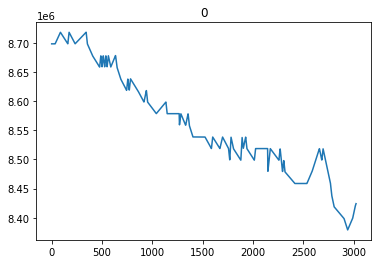

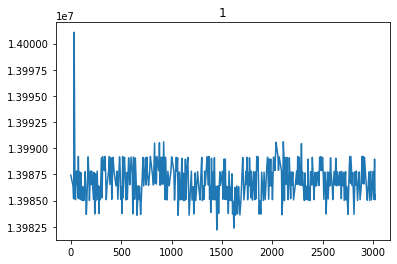

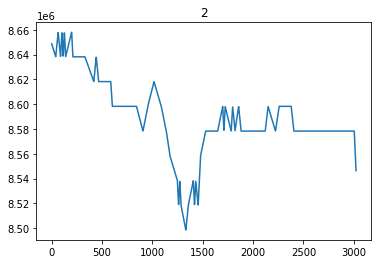

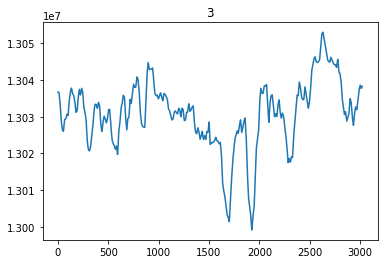

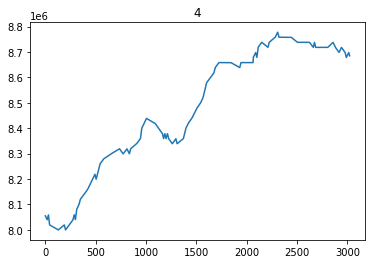

...

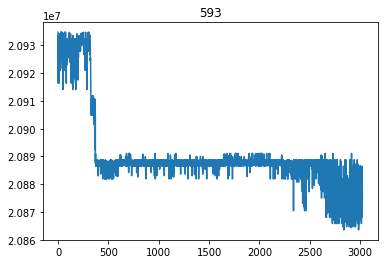

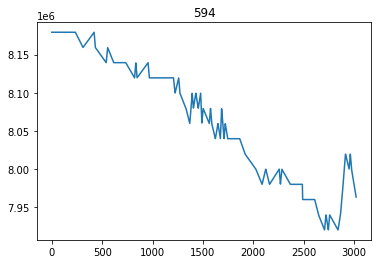

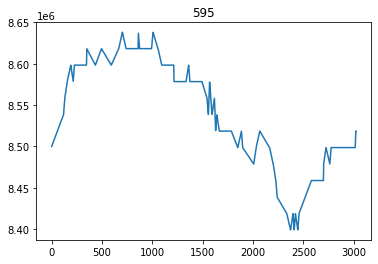

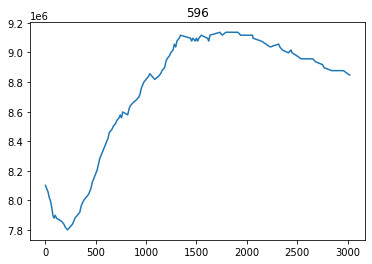

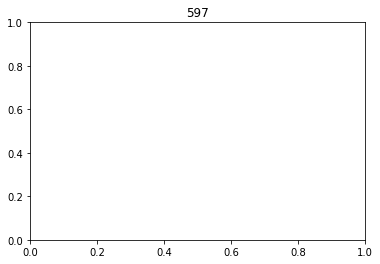

In [85]:
for i in range(len(normal_df)):
    plt.figure()
    tmp = str(i)
    #plt.title.set_title(tmp)
    plt.gca().set_title(tmp)
    plt.plot(normal_df[i])
    # Show/save figure as desired.
plt.show()

freq units: 3.307972E-05 Hz


<AxesSubplot:xlabel='BHP', ylabel='count'>

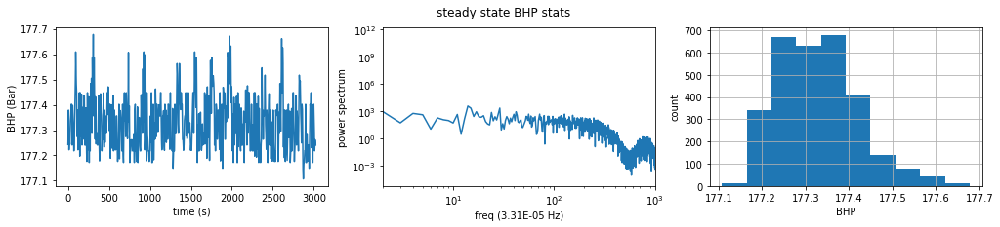

In [101]:
fig_ss_analysis, data = plt.subplots(1, 3, figsize=(17, 3))

from random import gauss
from random import seed
from pandas.plotting import autocorrelation_plot
from statsmodels.graphics.gofplots import qqplot

freq_units = 0.1/len(normal_df[566])
print('freq units: %(units)4E Hz' %{"units":(freq_units)})

fig_ss_analysis.suptitle('steady state BHP stats')
data[0].set_xlabel('time (s)')
data[0].set_ylabel('BHP (Bar)')
data[1].set_xlabel('freq (%(units).2E Hz)' %{"units":(freq_units)})
data[1].set_ylabel('power spectrum')
data[2].set_xlabel('BHP')
data[2].set_ylabel('count')

data[1].set_xlim(2,1000)
data[1].set_yscale('log')
data[1].set_xscale('log')

ss_BHP = normal_df[566]/100000 # from Pa to Bar

fft_ss = np.fft.rfft(ss_BHP)
fft_ss_abs = np.abs(fft_ss)
power_spectrum_ss = np.square(fft_ss_abs)


data[0].plot(ss_BHP)
data[1].plot(power_spectrum_ss)
ss_BHP.hist()

In [100]:
# write file for making figures  
file = open("normal_3W.dat", "w")
for i in ss_BHP:
    tmp = str(i) + "\n"
    file.writelines(tmp)
file.close()

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



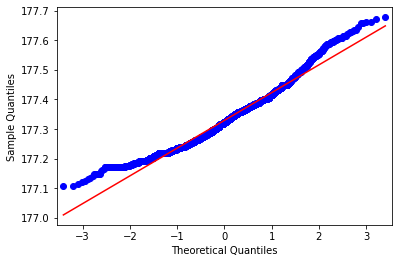

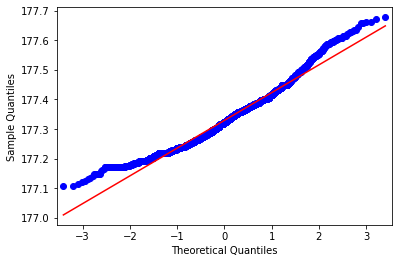

In [102]:
qqplot(ss_BHP, line='s')

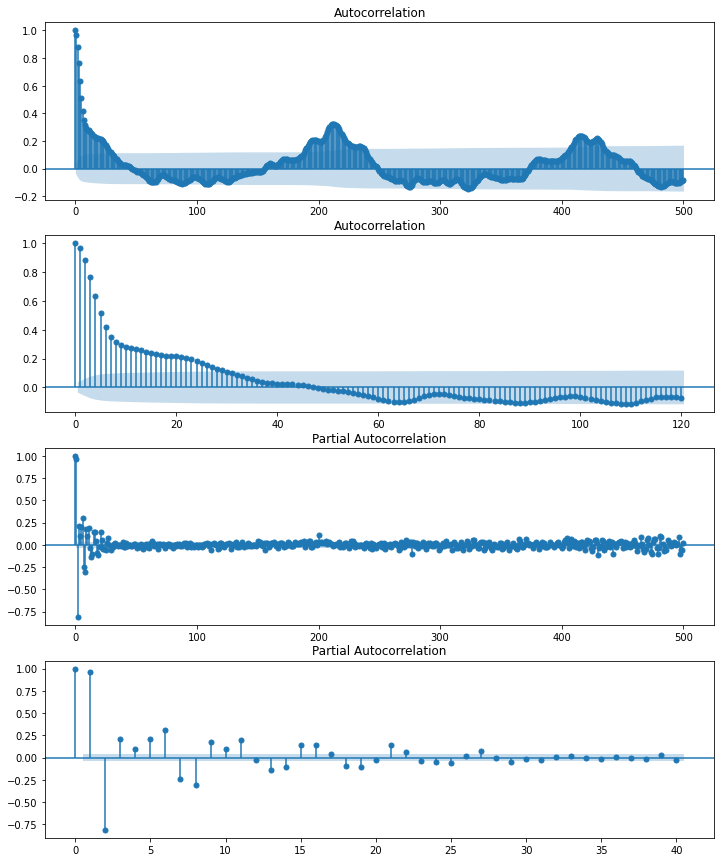

In [103]:
import statsmodels.api as sm

fig = plt.figure(figsize=(12,15))
ax1 = fig.add_subplot(411)
fig = sm.graphics.tsa.plot_acf(ss_BHP.values.squeeze(), lags=500, ax=ax1)
ax2 = fig.add_subplot(412)
fig = sm.graphics.tsa.plot_acf(ss_BHP.values.squeeze(), lags=120, ax=ax2)
ax3 = fig.add_subplot(413)
fig = sm.graphics.tsa.plot_pacf(ss_BHP, lags=500, ax=ax3)
ax4 = fig.add_subplot(414)
fig = sm.graphics.tsa.plot_pacf(ss_BHP, lags=40, ax=ax4)

In [95]:
max_time_delay = 20 
max_embedding_dimension = 10
stride = 3

signal = normal_df[566]/100000 # from Pa to Bar

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    signal, max_time_delay, max_embedding_dimension, stride=stride
    )
print('length of signal to analyze', int(len(signal)/stride))
print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")
embedding_dimension = optimal_time_delay
embedding_time_delay = optimal_time_delay
stride = 1

embedder = SingleTakensEmbedding(
    parameters_type="fixed", n_jobs=6, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

y_embedded = embedder.fit_transform(signal)

pca = PCA(n_components=3)
y_embedded_pca = pca.fit_transform(y_embedded)

norm = plot_point_cloud(y_embedded_pca)
norm

length of signal to analyze 1007
Optimal embedding time delay based on mutual information: 12
Optimal embedding dimension based on false nearest neighbors: 6


In [96]:
homology_dimensions = (0,1)
VRP = VietorisRipsPersistence(homology_dimensions=homology_dimensions)
PerDiagram = VRP.fit_transform_plot(y_embedded[None,:,:])

In [105]:
PE_BHP = PersistenceEntropy()
features = PE_BHP.fit_transform(PerDiagram)
features 

array([[11.46174408,  9.9092904 ]])

In [106]:
PE_BHP = PersistenceEntropy(normalize=True)
features = PE_BHP.fit_transform(PerDiagram)
features 

array([[1.45276785, 1.828015  ]])

In [107]:
pers_H0 = []
pers_H1 = []
max_pers_H0 = []
max_pers_H1 = []

for PersDiag in PerDiagram: 
    for point in PersDiag:
        birth = point[0]
        death = point[1]
        dimension = point[2]
        persistence = abs(death - birth)
        pers_H0.extend([persistence] if dimension == 0 else [])
        pers_H1.extend([persistence] if dimension == 1 else [])
    max_pers_H0.append(np.amax(pers_H0))
    max_pers_H1.append(np.amax(pers_H1))

print('Maximum Persistence for BHP:')
print("Max Pers in homology dimension H_0", max_pers_H0 )
print("Max Pers in homology dimension H_1", max_pers_H1 )

Maximum Persistence for BHP:
Max Pers in homology dimension H_0 [0.1472417712211609]
Max Pers in homology dimension H_1 [0.19225573539733887]


In [104]:
Betti = BettiCurve()
Betti_wn = Betti.fit_transform_plot(PerDiagram)

In [97]:
# write file for making figures  
file1 = open("norm3W_Pers_H0.dat", "w")
file2 = open("norm3W_Pers_H1.dat", "w")
for i in PerDiagram[0,:]:
    if i[2] == 0:
        tmp = str(i[0]) + str(' ') + str(i[1]) + "\n"
        file1.writelines(tmp)
    elif i[2] == 1:
        tmp = str(i[0]) + str(' ') + str(i[1]) + "\n"
        file2.writelines(tmp)
file1.close()
file2.close()

Some of these time series are not stationary. I convert Pa to Bar and remove those with a drift higher than 5 Bar.

In [9]:
naughty_list = []
for timeserie in normal_df:
    if abs(normal_df[timeserie].iloc[-1]-normal_df[timeserie].iloc[0]) > 500000:
        print(timeserie, normal_df[timeserie].iloc[-1], normal_df[timeserie].iloc[0])
        naughty_list.append(timeserie)

4 8684904.0 8055306.0
41 8664765.0 7644843.0
54 8699012.0 8079578.0
143 8741638.0 8058631.0
152 8409943.0 7875877.0
305 8604584.0 9268692.0
312 8717964.0 7850483.0
322 8632957.0 8063186.0
375 8861601.0 8145411.0
431 8968408.0 8178993.0
441 9075394.0 7947331.0
446 9198749.0 7461141.0
455 8837662.0 8037888.0
478 8631278.0 8059628.0
551 8266615.0 7580839.0
596 8847717.0 8101855.0


In [10]:
PatoBar = 1/100000
normal_df = normal_df.apply(lambda x: x*PatoBar) 
normal_signals = normal_signals * PatoBar

Removing from the steady state dataframe, those timeseries that have a deviation of more than 5 Bar

In [11]:
normal_df = normal_df.drop(naughty_list, axis=1)
normal_df

,0,1,2,3,5,6,7,8,9,10,...,586,587,588,589,590,591,592,593,594,595
0,86.98015,139.8743,86.48771,130.3668,141.8415,142.2115,209.3246,133.8594,211.4655,182.3391,...,98.92381,87.06865,85.50073,138.4955,209.9796,208.1128,100.0513,209.3476,81.79326,84.99783
1,86.98015,139.8738,86.48508,130.3666,141.8415,142.2171,209.3017,133.8617,211.4655,182.3391,...,98.92764,87.06683,85.50598,138.4976,209.9854,208.1066,100.0566,209.3017,81.79326,85.00115
2,86.98015,139.8733,86.48246,130.3665,141.8415,142.2226,209.2787,133.8641,211.4655,182.3391,...,98.93147,87.06503,85.51123,138.4997,209.9911,208.1066,100.0618,209.1638,81.79326,85.00448
3,86.98015,139.8729,86.47984,130.3663,141.8415,142.2282,209.3017,133.8664,211.4655,182.3391,...,98.93531,87.06321,85.51648,138.5019,209.9681,208.1087,100.0671,209.2327,81.79326,85.00780
4,86.98015,139.8724,86.47721,130.3662,141.8415,142.2338,209.3246,133.8653,211.4655,182.3391,...,98.93915,87.06139,85.52173,138.4987,209.9452,208.1191,100.0723,209.2787,81.79326,85.01112
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3018,84.21824,139.8769,85.53652,130.3803,142.2672,142.5995,209.2097,133.8388,211.4655,182.3391,...,98.87730,84.58620,85.54821,138.4916,209.9758,208.1755,100.1469,208.8650,79.66172,85.17471
3019,84.22378,139.8673,85.51839,130.3809,142.2728,142.5968,209.2327,133.8374,211.4655,182.3391,...,98.87461,84.58620,85.54267,138.4884,209.9777,208.1755,100.1469,208.8190,79.65405,85.18468
3020,84.22932,139.8577,85.50025,130.3815,142.2784,142.5941,209.0948,133.8359,211.4655,182.3391,...,98.87192,84.58620,85.53713,138.4912,209.9796,208.1442,100.1469,208.6811,79.64638,85.18468
3021,84.23486,139.8509,85.48212,130.3820,142.2839,142.5913,209.1063,133.8345,211.4655,182.3391,...,98.86923,84.58620,85.53159,138.4955,209.9816,208.1128,100.1469,208.7328,79.63870,85.18468


In [62]:
tmp = normal_df[normal_df.index % 3 == 0]  # Excludes every 3rd row starting from 0
tmp

NameError: name 'normal_df' is not defined

freq units: 3.307972E-05 Hz


<AxesSubplot:xlabel='BHP', ylabel='count'>

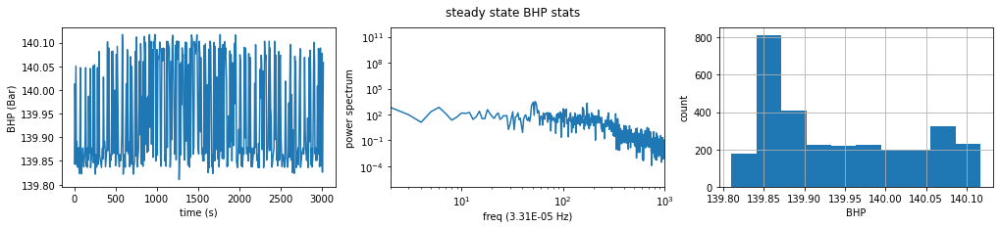

In [40]:
fig_ss_analysis, data = plt.subplots(1, 3, figsize=(17, 3))

from random import gauss
from random import seed
from pandas.plotting import autocorrelation_plot
from statsmodels.graphics.gofplots import qqplot

freq_units = 0.1/len(normal_df[25])
print('freq units: %(units)4E Hz' %{"units":(freq_units)})

fig_ss_analysis.suptitle('steady state BHP stats')
data[0].set_xlabel('time (s)')
data[0].set_ylabel('BHP (Bar)')
data[1].set_xlabel('freq (%(units).2E Hz)' %{"units":(freq_units)})
data[1].set_ylabel('power spectrum')
data[2].set_xlabel('BHP')
data[2].set_ylabel('count')

data[1].set_xlim(2,1000)
data[1].set_yscale('log')
data[1].set_xscale('log')

ss_BHP = normal_df[25]

fft_ss = np.fft.rfft(ss_BHP)
fft_ss_abs = np.abs(fft_ss)
power_spectrum_ss = np.square(fft_ss_abs)


data[0].plot(ss_BHP)
data[1].plot(power_spectrum_ss)
ss_BHP.hist()

In [43]:
# normality test
from scipy.stats import anderson

result = anderson(ss_BHP)
print('Statistic: %.3f' % result.statistic)
p = 0
for i in range(len(result.critical_values)):
	sl, cv = result.significance_level[i], result.critical_values[i]
	if result.statistic < result.critical_values[i]:
		print('%.3f: %.3f, data looks normal (fail to reject H0)' % (sl, cv))
	else:
		print('%.3f: %.3f, data does not look normal (reject H0)' % (sl, cv))

Statistic: 119.389
15.000: 0.575, data does not look normal (reject H0)
10.000: 0.655, data does not look normal (reject H0)
5.000: 0.786, data does not look normal (reject H0)
2.500: 0.917, data does not look normal (reject H0)
1.000: 1.091, data does not look normal (reject H0)


In [47]:
max_time_delay = 80 
max_embedding_dimension = 25
stride = 3

signal = normal_df[25]

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    signal, max_time_delay, max_embedding_dimension, stride=stride
    )
print('length of signal to analyze', int(len(signal)/stride))
print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")
embedding_dimension = optimal_time_delay
embedding_time_delay = optimal_time_delay
stride = 1

embedder = SingleTakensEmbedding(
    parameters_type="fixed", n_jobs=6, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

y_embedded = embedder.fit_transform(signal)

pca = PCA(n_components=3)
y_embedded_pca = pca.fit_transform(y_embedded)

norm = plot_point_cloud(y_embedded_pca)
norm

length of signal to analyze 1007
Optimal embedding time delay based on mutual information: 22
Optimal embedding dimension based on false nearest neighbors: 7


In [ ]:
homology_dimensions = (0, 1, 2)
VRP = VietorisRipsPersistence(homology_dimensions=homology_dimensions)

y_embedded_reshaped = y_embedded.reshape(1, *y_embedded.shape)
print(f"y_slug_embedded_reshaped.shape",y_embedded_reshaped.shape)
print(f"y_slug_embedded.shape", y_embedded.shape)

X_diagrams = VRP.fit_transform(y_embedded_reshaped)
VRP.plot(X_diagrams)

In [50]:
pers_H0 = []
pers_H1 = []
max_pers_H0 = []
max_pers_H1 = []

for PersDiag in X_diagrams: 
    for point in PersDiag:
        birth = point[0]
        death = point[1]
        dimension = point[2]
        persistence = abs(death - birth)
        pers_H0.extend([persistence] if dimension == 0 else [])
        pers_H1.extend([persistence] if dimension == 1 else [])
    max_pers_H0.append(np.amax(pers_H0))
    max_pers_H1.append(np.amax(pers_H1))

print('Maximum Persistence for BHP:')
print("Max Pers in homology dimension H_0", max_pers_H0 )
print("Max Pers in homology dimension H_1", max_pers_H1 )

Maximum Persistence for BHP:
Max Pers in homology dimension H_0 [0.16241075098514557]
Max Pers in homology dimension H_1 [0.2228960394859314]


Let's start by embedding each normal operation time series to their optimal parameters. This is probably an overkill, but at least we'll see if there is any clear trend in the topological indicators.

In [22]:
def batch_analyzer(input_df, stride, max_embedding_dimension, max_time_delay):
    max_time_delay = int(max_time_delay)
    max_embedding_dimension = int(max_embedding_dimension)
    homology_dimensions = (0, 1)
    VRP = VietorisRipsPersistence(homology_dimensions=homology_dimensions)
    pca = PCA(n_components=3)
    PE_signal = PersistenceEntropy()
    PE_norm = PersistenceEntropy(normalize=True)

    entropies = []
    norm_entropies = []
    diagrams = []
    point_clouds_pca = []
    i = 0
    
    print('max time delay:',max_time_delay, 'max dim:',max_embedding_dimension)
    
    for timeserie in input_df:
        
        i += 1
        optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
            input_df[timeserie], max_time_delay, max_embedding_dimension, stride=stride
            )
        if optimal_embedding_dimension < 3:
            optimal_embedding_dimension = 3
            
        print('analyzing nr.',i, 'progress:',int(100*i/len(input_df.columns)),'%', 'dim',optimal_embedding_dimension,'delay', optimal_time_delay)

        embedder = SingleTakensEmbedding(
            parameters_type="fixed", n_jobs=6, time_delay=optimal_time_delay, dimension=optimal_embedding_dimension, stride=stride
            )

        y_signal_embedded = embedder.fit_transform(input_df[timeserie])
        y_signal_embedded_reshaped = y_signal_embedded.reshape(1, *y_signal_embedded.shape)
        y_signal_embedded_pca = pca.fit_transform(y_signal_embedded)

        X_diagram = VRP.fit_transform(y_signal_embedded_reshaped)
        features = PE_signal.fit_transform(X_diagram)
        features_norm = PE_norm.fit_transform(X_diagram)
        if optimal_embedding_dimension > 3:
            point_clouds_pca.append(y_signal_embedded_pca)
        else:
            point_clouds_pca.append(y_signal_embedded)
        entropies.append(features)
        norm_entropies.append(features_norm)
        diagrams.append(X_diagram)
    return(point_clouds_pca, diagrams, entropies, norm_entropies)

In [23]:
normal_point_clouds_pca, normal_diagrams, normal_entropies, normal_norm_entropies = batch_analyzer(normal_df, 3, 13, 90)


max time delay: 90 max dim: 13
analyzing nr. 1 progress: 0 % dim 3 delay 87
analyzing nr. 2 progress: 0 % dim 8 delay 29
analyzing nr. 3 progress: 0 % dim 9 delay 88
analyzing nr. 4 progress: 0 % dim 8 delay 87
analyzing nr. 5 progress: 0 % dim 9 delay 87
analyzing nr. 6 progress: 1 % dim 9 delay 90
analyzing nr. 7 progress: 1 % dim 9 delay 75
analyzing nr. 8 progress: 1 % dim 6 delay 46
analyzing nr. 9 progress: 1 % dim 3 delay 90
analyzing nr. 10 progress: 1 % dim 9 delay 90
analyzing nr. 11 progress: 1 % dim 6 delay 29
analyzing nr. 12 progress: 2 % dim 7 delay 81
analyzing nr. 13 progress: 2 % dim 6 delay 86
analyzing nr. 14 progress: 2 % dim 4 delay 89
analyzing nr. 15 progress: 2 % dim 5 delay 90
analyzing nr. 16 progress: 2 % dim 3 delay 81
analyzing nr. 17 progress: 2 % dim 6 delay 51
analyzing nr. 18 progress: 3 % dim 9 delay 89
analyzing nr. 19 progress: 3 % dim 7 delay 90
analyzing nr. 20 progress: 3 % dim 9 delay 89
analyzing nr. 21 progress: 3 % dim 5 delay 90
analyzing nr

analyzing nr. 175 progress: 30 % dim 9 delay 90
analyzing nr. 176 progress: 30 % dim 5 delay 90
analyzing nr. 177 progress: 30 % dim 7 delay 26
analyzing nr. 178 progress: 30 % dim 9 delay 90
analyzing nr. 179 progress: 30 % dim 6 delay 41
analyzing nr. 180 progress: 30 % dim 6 delay 64
analyzing nr. 181 progress: 31 % dim 7 delay 83
analyzing nr. 182 progress: 31 % dim 9 delay 88
analyzing nr. 183 progress: 31 % dim 6 delay 89
analyzing nr. 184 progress: 31 % dim 9 delay 88
analyzing nr. 185 progress: 31 % dim 10 delay 62
analyzing nr. 186 progress: 32 % dim 6 delay 84
analyzing nr. 187 progress: 32 % dim 7 delay 82
analyzing nr. 188 progress: 32 % dim 7 delay 89
analyzing nr. 189 progress: 32 % dim 7 delay 88
analyzing nr. 190 progress: 32 % dim 5 delay 41
analyzing nr. 191 progress: 32 % dim 8 delay 75
analyzing nr. 192 progress: 33 % dim 6 delay 49
analyzing nr. 193 progress: 33 % dim 7 delay 90
analyzing nr. 194 progress: 33 % dim 7 delay 90
analyzing nr. 195 progress: 33 % dim 9 

analyzing nr. 346 progress: 59 % dim 9 delay 90
analyzing nr. 347 progress: 59 % dim 7 delay 90
analyzing nr. 348 progress: 59 % dim 6 delay 49
analyzing nr. 349 progress: 60 % dim 12 delay 50
analyzing nr. 350 progress: 60 % dim 10 delay 27
analyzing nr. 351 progress: 60 % dim 6 delay 30
analyzing nr. 352 progress: 60 % dim 9 delay 90
analyzing nr. 353 progress: 60 % dim 3 delay 87
analyzing nr. 354 progress: 60 % dim 7 delay 90
analyzing nr. 355 progress: 61 % dim 7 delay 84
analyzing nr. 356 progress: 61 % dim 3 delay 90
analyzing nr. 357 progress: 61 % dim 9 delay 88
analyzing nr. 358 progress: 61 % dim 9 delay 90
analyzing nr. 359 progress: 61 % dim 10 delay 83
analyzing nr. 360 progress: 61 % dim 9 delay 89
analyzing nr. 361 progress: 62 % dim 8 delay 90
analyzing nr. 362 progress: 62 % dim 3 delay 90
analyzing nr. 363 progress: 62 % dim 8 delay 90
analyzing nr. 364 progress: 62 % dim 3 delay 90
analyzing nr. 365 progress: 62 % dim 4 delay 90
analyzing nr. 366 progress: 62 % dim 

analyzing nr. 517 progress: 88 % dim 9 delay 89
analyzing nr. 518 progress: 89 % dim 3 delay 90
analyzing nr. 519 progress: 89 % dim 9 delay 90
analyzing nr. 520 progress: 89 % dim 7 delay 65
analyzing nr. 521 progress: 89 % dim 9 delay 90
analyzing nr. 522 progress: 89 % dim 9 delay 90
analyzing nr. 523 progress: 90 % dim 9 delay 90
analyzing nr. 524 progress: 90 % dim 9 delay 90
analyzing nr. 525 progress: 90 % dim 6 delay 45
analyzing nr. 526 progress: 90 % dim 9 delay 90
analyzing nr. 527 progress: 90 % dim 8 delay 90
analyzing nr. 528 progress: 90 % dim 9 delay 90
analyzing nr. 529 progress: 91 % dim 9 delay 90
analyzing nr. 530 progress: 91 % dim 10 delay 86
analyzing nr. 531 progress: 91 % dim 9 delay 88
analyzing nr. 532 progress: 91 % dim 10 delay 82
analyzing nr. 533 progress: 91 % dim 10 delay 86
analyzing nr. 534 progress: 91 % dim 5 delay 79
analyzing nr. 535 progress: 92 % dim 6 delay 90
analyzing nr. 536 progress: 92 % dim 6 delay 87
analyzing nr. 537 progress: 92 % dim 

mean H0 Entropy: 9.114630949479466 +/- 1.7947237637126534
mean H1 Entropy: 5.732083105658894 +/- 2.931529883428952
mean H0 normalized Entropy: 1.1840858545854762 +/- 14.398844009784659
mean H1 normalized Entropy: 2.433573159555162 +/- 93.55270290772002


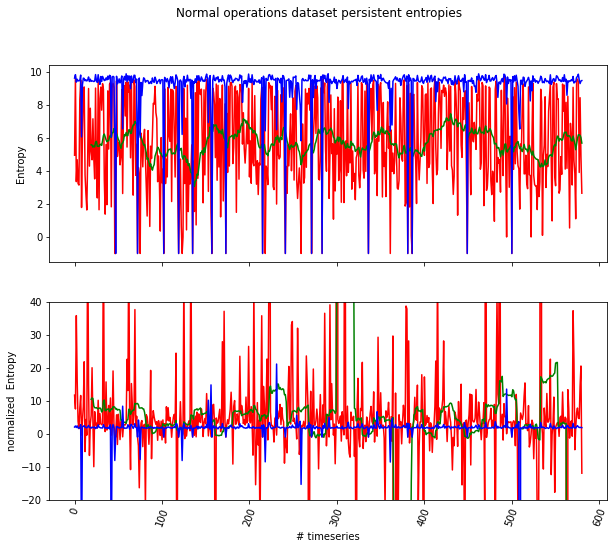

In [35]:
tmp_entropies = normal_entropies
Entropy_H0 = []
Entropy_H1 = []
tmp_normalized = normal_norm_entropies
Entropy_H0_norm = []
Entropy_H1_norm = []

for item in tmp_entropies:
    Entropy_H0.append(item[0][0])
    Entropy_H1.append(item[0][1])

for item in tmp_normalized:
    Entropy_H0_norm.append(item[0][0])
    Entropy_H1_norm.append(item[0][1])
    
Entropy_H1_series = pd.Series(Entropy_H1)
Entropy_H1_norm_series = pd.Series(Entropy_H1_norm)

print("mean H0 Entropy:", pd.Series(Entropy_H0).mean(), '+/-', pd.Series(Entropy_H0).std())
print("mean H1 Entropy:", pd.Series(Entropy_H1).mean(), '+/-', pd.Series(Entropy_H1).std())
print("mean H0 normalized Entropy:", pd.Series(Entropy_H0_norm).mean(), '+/-', pd.Series(Entropy_H0_norm).std())
print("mean H1 normalized Entropy:", pd.Series(Entropy_H1_norm).mean(), '+/-', pd.Series(Entropy_H1_norm).std())

entropies, ts = plt.subplots(2,figsize=(10,8),sharex = True)

entropies.suptitle('Normal operations dataset persistent entropies')
ts[1].set_xlabel("# timeseries")
ts[0].set_ylabel('Entropy')
ts[1].set_ylabel('normalized  Entropy')

degrees = 70
plt.xticks(rotation=degrees)

ts[0].plot(Entropy_H1,'r-')
ts[0].plot(Entropy_H1_series.rolling(20).mean(), 'g-')
ts[0].plot(Entropy_H0,'b-')

ts[1].set_ylim([-20,40])
ts[1].plot(Entropy_H1_norm,'r-')
ts[1].plot(Entropy_H1_norm_series.rolling(20).mean(), 'g-')
ts[1].plot(Entropy_H0_norm,'b-')

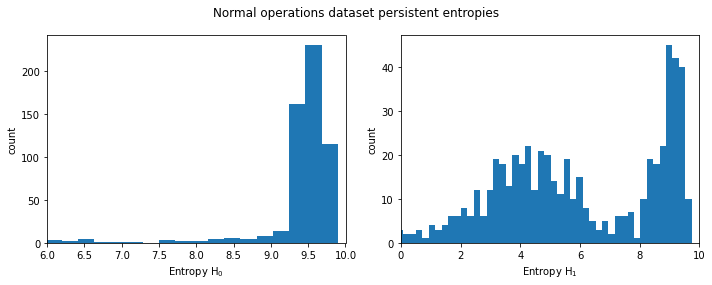

In [25]:
stats_entropy, data = plt.subplots(1, 2,figsize=(10,4))
stats_entropy.suptitle('Normal operations dataset persistent entropies')

data[0].set_xlabel('Entropy H$_0$')
data[0].set_ylabel('count')
data[1].set_xlabel("Entropy H$_1$")
data[1].set_ylabel('count')

data[0].set_xlim(6,10)
data[1].set_xlim(0,10)
data[0].hist(Entropy_H0, bins=50)
data[1].hist(Entropy_H1, bins=50)

plt.tight_layout()

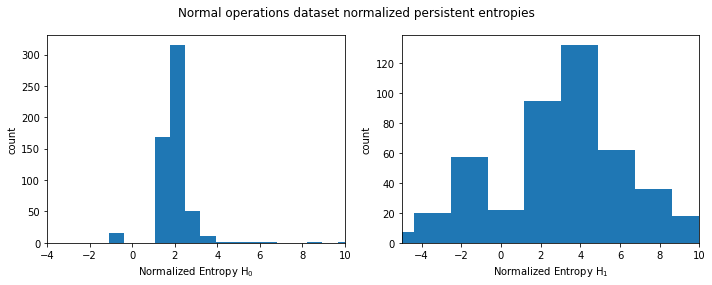

In [26]:
stats_entropy, data = plt.subplots(1, 2,figsize=(10,4))

stats_entropy.suptitle('Normal operations dataset normalized persistent entropies')

data[0].set_xlabel('Normalized Entropy H$_0$')
data[0].set_ylabel('count')
data[1].set_xlabel("Normalized Entropy H$_1$")
data[1].set_ylabel('count')

data[0].set_xlim(-4,10)
data[1].set_xlim(-5,10)
data[0].hist(Entropy_H0_norm, bins=500)
data[1].hist(Entropy_H1_norm, bins=1500)

plt.tight_layout()

there is too much variance in the entropy, better to restrict the analysis to a single set of parameters.

In [27]:
TE = TakensEmbedding(time_delay=85, dimension=9, stride=3)
homology_dimensions = (0, 1)
VRP = VietorisRipsPersistence(homology_dimensions=homology_dimensions)
PE = PersistenceEntropy()
PE_norm = PersistenceEntropy(normalize=True)
Betti = BettiCurve()

normal_point_cloud  = TE.fit_transform(normal_signals)
normal_diagrams = VRP.fit_transform(normal_point_cloud)
normal_entropy = PE.fit_transform(normal_diagrams)
normal_entropynorm = PE_norm.fit_transform(normal_diagrams)
normal_Betti = Betti.fit_transform(normal_diagrams)

In [28]:
import plotly.express as px
figBetti = px.line()

for i in range(len(normal_Betti[:,0,0])):
#for i in range(50):
    figBetti.add_scatter(y=(normal_Betti[i, 0, :]+5*i))
figBetti.show()

In [36]:
import statistics as stats
meanBettiH0 = []
medianBettiH0 = []
modeBettiH0 = []
meanBettiH1 = []
medianBettiH1 = []
modeBettiH1 = []

for i in range(len(normal_Betti[:,0,0])):
    meanBettiH0.append(stats.mean(normal_Betti[i,0,:]))
    medianBettiH0.append(stats.median(normal_Betti[i,0,:]))
    modeBettiH0.append(stats.mode(normal_Betti[i,0,:]))
    
for i in range(len(normal_Betti[:,1,0])):
    meanBettiH1.append(stats.mean(normal_Betti[i,1,:]))
    medianBettiH1.append(stats.median(normal_Betti[i,1,:]))
    modeBettiH1.append(stats.mode(normal_Betti[i,1,:]))
    
figBetti = px.line()
figBetti.add_scatter(y=(meanBettiH0), name="Mean of Betti curve H_0")
figBetti.add_scatter(y=(medianBettiH0), name="Median of Betti curve H_0")
figBetti.add_scatter(y=(meanBettiH1), name="Mean of Betti curve H_1")
figBetti.add_scatter(y=(medianBettiH1), name="Median of Betti curve H_1")
#figBetti.add_scatter(y=(modeBettiH0),name="Mode of Betti curve H_0")
figBetti.show()


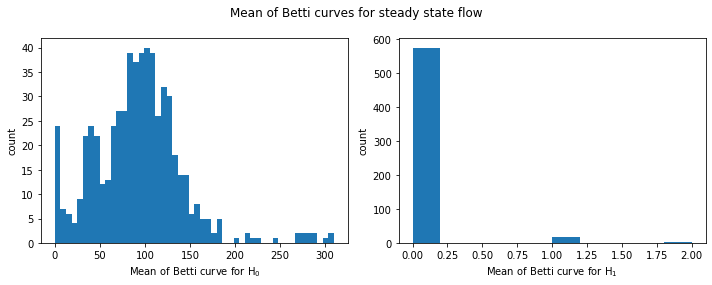

In [39]:
stats_entropy, data = plt.subplots(1, 2,figsize=(10,4))

stats_entropy.suptitle('Mean of Betti curves for steady state flow')

data[0].set_xlabel('Mean of Betti curve for H$_0$')
data[0].set_ylabel('count')
data[1].set_xlabel("Mean of Betti curve for H$_1$")
data[1].set_ylabel('count')

data[0].hist(meanBettiH0, bins=50)
data[1].hist(meanBettiH1)

plt.tight_layout()

In [ ]:
meanBettiH1 = []
medianBettiH1 = []
modeBettiH1 = []

for i in range(len(normal_Betti[:,1,0])):
    meanBettiH1.append(stats.mean(normal_Betti[i,1,:]))
    medianBettiH1.append(stats.median(normal_Betti[i,1,:]))
    modeBettiH1.append(stats.mode(normal_Betti[i,1,:]))
    
    
figBetti = px.line()
figBetti.add_scatter(y=(meanBettiH1), name="Mean of Betti curve H_1")
figBetti.add_scatter(y=(medianBettiH1), name="Median of Betti curve H_1")
figBetti.show()


In [ ]:
pers_H1 = []
pers_H0 = []
max_pers_H0 = []
max_pers_H1 = []

for PersDiag in normal_diagrams: 
    for point in PersDiag:
        birth = point[0]
        death = point[1]
        dimension = point[2]
        persistence = abs(death - birth)
        pers_H0.extend([persistence] if dimension == 0 else [])
        pers_H1.extend([persistence] if dimension == 1 else [])
    max_pers_H0.append(np.amax(pers_H0))
    max_pers_H1.append(np.amax(pers_H1))
    pers_H0 = []
    pers_H1 = []
           
fig = px.line(title='Maximum Persistence for normal BHP')
fig.add_scatter(y=max_pers_H1, name="Max Pers in homology dimension H_1")
fig.add_scatter(y=max_pers_H0, name="Max Pers in homology dimension H_0")

fig.show() 

In [ ]:
stats_entropy, data = plt.subplots(1, 2,figsize=(10,4))

stats_entropy.suptitle('Normal operations dataset - Maximum Persistence')

data[0].set_xlabel('Max Persistence for H$_0$')
data[0].set_ylabel('count')
data[1].set_xlabel("Max Persistence for H$_1$")
data[1].set_ylabel('count')

data[0].hist(max_pers_H0, bins=50)
data[1].hist(max_pers_H1)

plt.tight_layout()

## Analysis of Slugging P - TPT

In [ ]:
slug_data_single_df = pd.read_csv("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/ALL/WELL-00001_20170320130025.csv")
signal = slug_data_single_df["P-TPT"]

In [ ]:
optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    signal, max_time_delay, max_embedding_dimension, stride=stride
    )

print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

embedding_dimension = optimal_embedding_dimension
embedding_time_delay = optimal_time_delay
stride = 1

embedder = SingleTakensEmbedding(
    parameters_type="fixed", n_jobs=optimal_embedding_dimension, time_delay=optimal_time_delay, dimension=6, stride=stride
)

signal_embedded = embedder.fit_transform(signal)

pca = PCA(n_components=3)
signal_embedded_pca = pca.fit_transform(signal_embedded)

plot_point_cloud(signal_embedded_pca)

In [ ]:
find_shortest_file("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/ALL/", "P-TPT")

In [ ]:
slugging_signals, slugging_df = read_files("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/REAL/", "P-TPT",3000)

In [ ]:
slugging_df

Convert everything to Bar to get better resolution in the filtration (otherwise the Betti curves are unreadable)

In [ ]:
PatoBar = 1/100000

slugging_df = slugging_df.apply(lambda x: x*PatoBar)
slugging_df 

In [ ]:
slug_point_clouds_pca, slug_diagrams, slug_entropies, slug_norm_entropies = batch_analyzer(slugging_df, 3, 12, 150)

In [ ]:
tmp = slug_entropies
Entropy_H0 = []
Entropy_H1 = []

for item in tmp:
    Entropy_H0.append(item[0][0])
    Entropy_H1.append(item[0][1])

Entropy_H0_slug = pd.Series(Entropy_H0)
Entropy_H1_slug = pd.Series(Entropy_H1)

In [ ]:
plt.plot(Entropy_H0_slug, 'b-')
plt.plot(Entropy_H1_slug, 'r-')
plt.plot(Entropy_H1_slug.rolling(5).mean(), 'g-')

In [ ]:
tmp = slug_norm_entropies
Entropy_H0 = []
Entropy_H1 = []

for item in tmp:
    Entropy_H0.append(item[0][0])
    Entropy_H1.append(item[0][1])

Entropy_H0_slug = pd.Series(Entropy_H0)
Entropy_H1_slug = pd.Series(Entropy_H1)

In [ ]:
plt.plot(Entropy_H0_slug, 'b-')
plt.plot(Entropy_H1_slug, 'r-')
plt.plot(Entropy_H1_slug.rolling(5).mean(), 'g-')

In [ ]:
find_shortest_file("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/SIMULATED/", "P-TPT")

In [ ]:
slugging_signals, slugging_SIM_df = read_files("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/SIMULATED/", "P-TPT",3000)
slugging_df = slugging_df.apply(lambda x: x*PatoBar)

In [ ]:
slugSIM_point_clouds_pca, slugSIM_diagrams, slugSIM_entropies, slugSIM_norm_entropies = batch_analyzer(slugging_SIM_df, 2, 20, 90)

In [ ]:
tmp = slugSIM_entropies
Entropy_H0 = []
Entropy_H1 = []

for item in tmp:
    Entropy_H0.append(item[0][0])
    Entropy_H1.append(item[0][1])

Entropy_H0_slug = pd.Series(Entropy_H0)
Entropy_H1_slug = pd.Series(Entropy_H1)

In [ ]:
plt.plot(Entropy_H0_slug, 'b-')
plt.plot(Entropy_H1_slug, 'r-')
plt.plot(Entropy_H1_slug.rolling(5).mean(), 'g-')

In [ ]:
tmp = slugSIM_norm_entropies
Entropy_H0 = []
Entropy_H1 = []

for item in tmp:
    Entropy_H0.append(item[0][0])
    Entropy_H1.append(item[0][1])

Entropy_H0_slug = pd.Series(Entropy_H0)
Entropy_H1_slug = pd.Series(Entropy_H1)

In [ ]:
plt.plot(Entropy_H0_slug, 'b-')
plt.plot(Entropy_H1_slug, 'r-')
plt.plot(Entropy_H1_slug.rolling(5).mean(), 'g-')

In [ ]:
slugging_signals, slugging_df = read_files("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/ALL/", "P-TPT",3000)
slugging_df = slugging_df.apply(lambda x: x*PatoBar)

In [ ]:
slug_point_clouds_pca, slug_diagrams, slug_entropies, slug_norm_entropies = batch_analyzer(slugging_df, 2, 12, 150)

In [ ]:
slug_data = read_files_bundle("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/ALL/", "P-TPT",3000)
slug_data = slug_data * PatoBar

VRP_onlyH0 = VietorisRipsPersistence(homology_dimensions =(0,))
VRP_onlyH1 = VietorisRipsPersistence(homology_dimensions =(1,))

TE = TakensEmbedding(time_delay=145, dimension=8, stride=2)
slug_data_norm = TE.fit_transform(slug_data)
slug_data_diagrams_norm = VRP.fit_transform(slug_data_norm)
slug_data_diagrams_H0 = VRP_onlyH0.fit_transform(slug_data_norm)
slug_data_diagrams_H1 = VRP_onlyH1.fit_transform(slug_data_norm)
slug_data_Betti_H0 = Betti.fit_transform(slug_data_diagrams_H0)
slug_data_Betti_H1 = Betti.fit_transform(slug_data_diagrams_H1)

Let's see the results for a simulated slugging event, sample nr.60

In [ ]:
TE.fit_transform_plot(slug_data, sample=60)

In [ ]:
VRP.fit_transform_plot(slug_data_norm, sample=60)

In [ ]:
sample60_H0 = VRP_onlyH0.fit_transform_plot(slug_data_norm, sample=60)

In [ ]:
slug_data_diagrams_H0[60]

In [ ]:
slug_data_Betti_H1[60]

In [ ]:
VRP_onlyH0.fit_transform_plot(slug_data_norm, sample=4)

In [ ]:
Betti.fit_transform_plot(slug_data_diagrams_H0, sample=60)

In [ ]:
slug_data_single_df = pd.read_csv("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/ALL/SIMULATED_00062.csv")
signal = slug_data_single_df["P-TPT"]
signal = signal / 100000

max_time_delay = 180
max_embedding_dimension = 12
stride = 1

ratio = len(signal)/1500
signal = signal[::int(ratio)]

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    signal, max_time_delay, max_embedding_dimension, stride=stride
    )
print(f"signal lenght: {len(signal)}")
print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

embedding_dimension = optimal_embedding_dimension
embedding_time_delay = optimal_time_delay


embedder = SingleTakensEmbedding(
    parameters_type="fixed", n_jobs=-1, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

signal_embedded = embedder.fit_transform(signal)

pca = PCA(n_components=3)
signal_embedded_pca = pca.fit_transform(signal_embedded)
diagram = VRP.fit_transform_plot(signal_embedded_pca[None,:,:])
Betti.fit_transform_plot(diagram)



Let's see sample nr.64 (non simulated)

In [ ]:
TE.fit_transform_plot(slug_data, sample=4)

In [ ]:
VRP.fit_transform_plot(slug_data_norm, sample=4)

In [ ]:
figBettiSlug0 = px.line()

#for i in range(len(slug_data_Betti_H0[:,0,0])):
for i in range(20):
    figBettiSlug0.add_scatter(y=(slug_data_Betti_H0[i, 0, :]+50*i))
figBettiSlug0.show()

In [ ]:
figBettiSlug1 = px.line()

for i in range(len(slug_data_Betti_H1[:,0,0])):
    figBettiSlug1.add_scatter(y=(slug_data_Betti_H1[i, 0, :]+5*i))
figBettiSlug1.show()

In [ ]:
meanBettiH0 = []
medianBettiH0 = []
modeBettiH0 = []
maxBettiH0 = []
meanBettiH1 = []
medianBettiH1 = []
modeBettiH1 = []
maxBettiH1 = []

for i in range(len(slug_data_Betti_H0[:,0,0])):
    meanBettiH0.append(stats.mean(slug_data_Betti_H0[i,0,:]))
    medianBettiH0.append(stats.median(slug_data_Betti_H0[i,0,:]))
    modeBettiH0.append(stats.mode(slug_data_Betti_H0[i,0,:]))
    maxBettiH0.append(np.amax(slug_data_Betti_H0[i,0,:]))
    
for i in range(len(slug_data_Betti_H1[:,0,0])):
    meanBettiH1.append(stats.mean(slug_data_Betti_H1[i,0,:]))
    medianBettiH1.append(stats.median(slug_data_Betti_H1[i,0,:]))
    modeBettiH1.append(stats.mode(slug_data_Betti_H1[i,0,:]))
    maxBettiH1.append(np.amax(slug_data_Betti_H1[i,0,:]))
    
    
figBettiH0 = px.line()
figBettiH0.add_scatter(y=(meanBettiH0), name="Mean of Betti curve H_0")
figBettiH0.add_scatter(y=(medianBettiH0), name="Median of Betti curve H_0")
figBettiH0.add_scatter(y=(modeBettiH0),name="Mode of Betti curve H_0")
#figBetti.add_scatter(y=(maxBettiH0),name="Max of Betti curve H_0")
figBettiH0.show()

In [ ]:
figBettiH1 = px.line()
figBettiH1.add_scatter(y=(meanBettiH1), name="Mean of Betti curve H_1")
figBettiH1.add_scatter(y=(medianBettiH1), name="Median of Betti curve H_1")
figBettiH1.add_scatter(y=(modeBettiH1),name="Mode of Betti curve H_1")
#figBetti.add_scatter(y=(maxBettiH1),name="Max of Betti curve H_1")

figBettiH1.show()

In [ ]:
slug_data_Betti_H0[2]

In [ ]:
maxBettiH0 =[]
maxBettiH1 =[]

for i in range(len(slug_data_Betti_H0[:,0,0])):
    maxBettiH0.append(np.amax(slug_data_Betti_H0[i,0,:]))
for i in range(len(slug_data_Betti_H1[:,0,0])):
    maxBettiH1.append(np.amax(slug_data_Betti_H1[i,0,:]))
        
figBetti = px.line()
#figBetti.add_scatter(y=(maxBettiH0),name="Max of Betti curve H_0")
figBetti.add_scatter(y=(maxBettiH1),name="Max of Betti curve H_1")

figBetti.show()

In [ ]:
pers_H0 = []
pers_H1 = []
max_pers_H0 = []
max_pers_H1 = []

for PersDiag in slug_data_diagrams_norm: 
    for point in PersDiag:
        birth = point[0]
        death = point[1]
        dimension = point[2]
        persistence = abs(death - birth)
        pers_H0.extend([persistence] if dimension == 0 else [])
        pers_H1.extend([persistence] if dimension == 1 else [])
    max_pers_H0.append(np.amax(pers_H0))
    max_pers_H1.append(np.amax(pers_H1))
    pers_H0 = []
    pers_H1 = []
           
fig = px.line(title='Maximum Persistence for BHP, slugging dataset')
fig.add_scatter(y=max_pers_H0, name="Max Pers in homology dimension H_0")
fig.add_scatter(y=max_pers_H1, name="Max Pers in homology dimension H_1")
fig.show() 

In [ ]:
slug_data_df = pd.read_csv("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/SIMULATED_00005.csv")

In [ ]:
slug_data_df

In [ ]:
fig, ts = plt.subplots(8,figsize=(10,20),sharex = True)

fig.suptitle('Slug dataset #1')
ts[7].set_xlabel('time')
ts[0].set_ylabel("P-PDG")
ts[1].set_ylabel('P-TPT')
ts[2].set_ylabel('T-TPT')
ts[3].set_ylabel("P-MON-CKP")
ts[4].set_ylabel('T-JUS-CKP')
ts[5].set_ylabel('P-JUS-CKGL')
ts[6].set_ylabel("T-JUS-CKGL")
ts[7].set_ylabel('QGL')

degrees = 70
plt.xticks(rotation=degrees)

ts[0].plot(slug_data_df.index, slug_data_df["P-PDG"])
ts[1].plot(slug_data_df.index, slug_data_df["P-TPT"])
ts[2].plot(slug_data_df.index, slug_data_df["T-TPT"])
ts[3].plot(slug_data_df.index, slug_data_df["P-MON-CKP"])
ts[4].plot(slug_data_df.index, slug_data_df["T-JUS-CKP"])
ts[5].plot(slug_data_df.index, slug_data_df["P-JUS-CKGL"])
ts[6].plot(slug_data_df.index, slug_data_df["T-JUS-CKGL"])
ts[7].plot(slug_data_df.index, slug_data_df["QGL"])


In [ ]:
slug_data_df['P-TPT'].isnull().values.any()

In [ ]:
slug_data_df= slug_data_df.interpolate()

In [ ]:
period = 50
periodicSampler = Resampler(period=period)
slug_data_df = slug_data_df.interpolate(method='linear')
signal = slug_data_df["P-TPT"]

#slug_data_df.index, slug_data_df["P-TPT"]
index_sampled, signal_sampled = periodicSampler.fit_transform_resample(slug_data_df.index, signal)

#print(index_sampled, signal_sampled, len(signal_sampled))

In [ ]:
signal_downsampled = pd.DataFrame(signal_sampled,
                  index=index_sampled, columns=['P-TPT'])
#signal_downsampled['P-TPT']
plt.xlabel('time');
plt.ylabel('P-TPT');
plt.plot(signal_downsampled.index,signal_downsampled['P-TPT'], 'bo-')

In [ ]:
print('length of signal to analyze', len(signal_downsampled))

max_time_delay = 150 
max_embedding_dimension = 15
stride = 1

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    signal_downsampled, max_time_delay, max_embedding_dimension, stride=stride
    )

print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

embedding_dimension = optimal_embedding_dimension
embedding_time_delay = optimal_time_delay

embedder = SingleTakensEmbedding(
    parameters_type="fixed", n_jobs=6, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

signal_embedded = embedder.fit_transform(signal_downsampled)

pca = PCA(n_components=3)
signal_embedded_pca = pca.fit_transform(signal_embedded)

plot_point_cloud(signal_embedded_pca)

In [ ]:
homology_dimensions = (0, 1)
VRP = VietorisRipsPersistence(homology_dimensions=homology_dimensions)

signal_embedded_reshaped = signal_embedded.reshape(1, *signal_embedded.shape)
print(f"y_wn_embedded_reshaped.shape",signal_embedded_reshaped.shape)
print(f"y_wn_embedded.shape", signal_embedded.shape)

PerHom_signal = VRP.fit_transform(signal_embedded_reshaped)
VRP.plot(PerHom_signal)

In [ ]:
PE_slug = PersistenceEntropy()
PE_slug_norm = PersistenceEntropy(normalize=True)
features = PE_slug.fit_transform(PerHom_signal)
features_norm = PE_slug_norm.fit_transform(PerHom_signal)

In [ ]:
features

In [ ]:
features_norm

In [ ]:
slug_data_sim_df = pd.read_csv("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/8/WELL-00021_20170509013517.csv")

In [ ]:
slug_data_sim_df = slug_data_sim_df.head(18000)

fig, ts = plt.subplots(8,figsize=(10,20),sharex = True)

fig.suptitle('Simulated Slug dataset #1')
ts[7].set_xlabel('time')
ts[0].set_ylabel("P-PDG")
ts[1].set_ylabel('P-TPT')
ts[2].set_ylabel('T-TPT')
ts[3].set_ylabel("P-MON-CKP")
ts[4].set_ylabel('T-JUS-CKP')
ts[5].set_ylabel('P-JUS-CKGL')
ts[6].set_ylabel("T-JUS-CKGL")
ts[7].set_ylabel('QGL')

degrees = 70
plt.xticks(rotation=degrees)

ts[0].plot(slug_data_sim_df.index, slug_data_sim_df["P-PDG"])
ts[1].plot(slug_data_sim_df.index, slug_data_sim_df["P-TPT"])
ts[2].plot(slug_data_sim_df.index, slug_data_sim_df["T-TPT"])
ts[3].plot(slug_data_sim_df.index, slug_data_sim_df["P-MON-CKP"])
ts[4].plot(slug_data_sim_df.index, slug_data_sim_df["T-JUS-CKP"])
ts[5].plot(slug_data_sim_df.index, slug_data_sim_df["P-JUS-CKGL"])
ts[6].plot(slug_data_sim_df.index, slug_data_sim_df["T-JUS-CKGL"])
ts[7].plot(slug_data_sim_df.index, slug_data_sim_df["QGL"])


In [ ]:
period = 5
periodicSampler = Resampler(period=period)
signal = slug_data_sim_df["P-TPT"]

slug_data_sim_df.index, slug_data_sim_df["P-TPT"]
index_sampled, signal_sim_sampled = periodicSampler.fit_transform_resample(slug_data_sim_df.index, signal)


In [ ]:
signal_sim_sampled

In [ ]:
signal_sim_downsampled = pd.DataFrame(signal_sim_sampled,
                  index=index_sampled, columns=['P-TPT'])
plt.xlabel('time');
plt.ylabel('P-TPT');
plt.plot(signal_sim_downsampled.index,signal_sim_downsampled['P-TPT'], 'bo-')

In [ ]:
print('length of signal to analyze', len(signal_sim_downsampled))

max_time_delay = 50 
max_embedding_dimension = 10
stride = 1

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    signal_sim_downsampled, max_time_delay, max_embedding_dimension, stride=stride
    )

print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

embedding_dimension = optimal_embedding_dimension
embedding_time_delay = optimal_time_delay

embedder = SingleTakensEmbedding(
    parameters_type="search", n_jobs=6, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

signal_sim_embedded = embedder.fit_transform(signal_sim_downsampled)

pca = PCA(n_components=3)
signal_sim_embedded_pca = pca.fit_transform(signal_sim_embedded)

plot_point_cloud(signal_sim_embedded_pca)

In [ ]:
signal_sim_embedded_reshaped = signal_sim_embedded.reshape(1, *signal_sim_embedded.shape)
print(f"y_wn_embedded_reshaped.shape",signal_sim_embedded_reshaped.shape)
print(f"y_wn_embedded.shape", signal_sim_embedded_reshaped.shape)

PerHom_sim_signal = VRP.fit_transform(signal_sim_embedded_reshaped)
features_sim = PE_slug.fit_transform(PerHom_signal)
features_sim_norm = PE_slug_norm.fit_transform(PerHom_signal)

In [ ]:
features_sim

In [ ]:
features_sim_norm

In [ ]:
VRP.plot(PerHom_sim_signal)

In [ ]:
PerHom_sim_signal.shape

In [ ]:
PerHom_signal.shape

#tmp = np.vstack([PerHom_signal,PerHom_sim_signal])
#tmp.shape

In [ ]:
diagramScaler = Scaler()
PerHom_signal_scaled = diagramScaler.fit_transform(PerHom_signal)
diagramScaler.plot(PerHom_signal_scaled)

In [ ]:
PerHom_signal_sim_scaled = diagramScaler.fit_transform(PerHom_sim_signal)
diagramScaler.plot(PerHom_signal_sim_scaled)

In [ ]:
features_sim = PE_slug.fit_transform(PerHom_signal_scaled)
features_sim_norm = PE_slug_norm.fit_transform(PerHom_signal_scaled)
features_sim

In [ ]:
features_sim_norm

In [ ]:
HK = HeatKernel(sigma=.15, n_bins=60, n_jobs=-1) 
HK_slug = HK.fit_transform_plot(PerHom_signal_scaled, homology_dimension_idx=1)

In [ ]:
HK.fit_transform_plot(PerHom_signal_sim_scaled, homology_dimension_idx=1)

In [ ]:
"/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/0/WELL-00006_20170207180042.csv ", "P-TPT",3000)